# Initialization

## Fetching the code for the project

In this first step, we install the required software to the internal store of the Jupyter environment. The software consists of two parts: (i) standard software installed from pip, and (ii) the code that actually makes up our project. The latter is kept under version-controlled in a git repository (`INM-6/collab-waves`), so that we can easily develop our analysis using our standard workflows. A standard `requirements.txt` file in that git repository is used to inform of the dependencies on standard software. It is important to have these requirements in a single, central location to ensure that all analysis scripts will be executed in a common environment.

Thus, we start by installing the `gitpython` package to give us easy access to our code repository.

In [1]:
!pip install gitpython --quiet

In [2]:
import os
import git

Next, we use `gitpython` to access our code. If the code resides in a public repository, it is easily cloned.

Of course, in a development scenario, this would be work in progress that we may not want to share publically. Thus, the code should be kept in a secure repository, e.g., a private repo on github. One option to access this code repository is to create a personalized access token for use within the Collab. This token can be obtained in github under user->settings->developer options. However, note that with this token, access to all available repositories of that github user is possible. Therefore, we suggest to create a *dummy* user on github that will only be granted access to that particular code repository required for the notebooks of the Collab.

In [3]:
# Fetching code from a public github repository requires only git as user name
my_auth_token = "git"

# Alternative:
# Fetching code from a private github repository requires to set a token (with repo read permission) 
# for a user that has access to the repository
# my_auth_token = "MYTOKEN"

for code_repo in ['collab-waves']:
    if os.path.exists(code_repo):
        # Pull latest version if repo was already cloned
        g = git.cmd.Git(code_repo)
        g.pull()
    else:
        # Clone repo if container was wiped
        git.Repo.clone_from(
            "https://" + my_auth_token + "@github.com/"
            "INM-6/%s.git" % code_repo,
            code_repo)

Next we install the exact requirements as indicated in `requirements.txt` file in the code repository.

In [4]:
!pip uninstall -y --quiet neo
!pip install --quiet -r collab-waves/src/requirements.txt
!pip install pyunicore --upgrade

Requirement already up-to-date: pyunicore in /opt/conda/envs/python2/lib/python2.7/site-packages
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


## Load required modules

Now that we have set up a working environment, we the load modules to check version numbers, but also to be able to work interactively in this notebook. Note however, that the actual analysis is performed by stand-alone scripts contained in the code repository. These will run in their own instantiation of the Python interpreter to guarantee reproducibility. Nevertheless, all scripts will use the software environment we installed in the previous step when run within the Collab.

The esstential libraries we use, besides numpy and matplotlib, are Neo, Elephant and pyunicore. Neo is a library the provides the data model for working with the activity datasets. Our data is stored in the Blackrock file format of Blackrock Microsystems (the manufacturer of Utah arrays), which can be conveniently loaded with a file I/O of Neo. Elephant is the analysis library used in HBP for data represented in the Neo data model. In particular, it is used by our analysis scripts to perform tasks such as extracting the beta phase information from the motor cortical local field potential data. pyunicore is the library that provides functions to execute our code on a supercomputer attached to the Collaboratory. We use it to run one of our analysis scripts on the JULIA system.

In [5]:
from IPython.display import Image
import numpy
import quantities as pq
import matplotlib
import matplotlib.pyplot as plt
import neo
import elephant
import pyunicore.client as unicore_client

%matplotlib notebook

# Print version numbers
print("Version numbers\n====================================")
print("numpy Version %s" % numpy.__version__)
print("quantities Version %s" % pq.__version__)
print("matplotlib Version %s" % matplotlib.__version__)
print("Neo Version %s" % neo.__version__)
print("Elephant Version %s" % elephant.__version__)

Version numbers
numpy Version 1.11.2
quantities Version 0.12.1
matplotlib Version 2.2.2
Neo Version 0.4.0dev
Elephant Version 0.5.0


Here we load a library from our code repository that contains all project parameters, lists of data files to consider in the project, and shared project-specific utility functions.

In [6]:
# Helper 
import sys
sys.path.insert(0, "collab-waves/src/common")
import wave_main

## Download datasets

In a next step, we will download a selected recording, one dataset contained in component 418 (Massively Parallel Data), to the Jupyter notebook storage. The selected recording(s) for this analysis are noted in the global parameter section for this analysis of the `wave_main.py` utility module.

**Future SGA2 step: Use Knowledge Graph API to download the dataset.**

In [ ]:
instances_list = nexus.instances.list(subpath="/minds/core/dataset/v0.0.4", full_text_query="Massively*", resolved=True)
print("{} items found".format(instances_list.total))

for instance in instances_list.results:
    print(json.dumps(instance.data, indent=4))
    print("\n********************************\n")
print(instance.data[u'http://hbp.eu/minds#datalink'])
print(instance.data[u'http://hbp.eu/minds#datasetDOI']

In [7]:
for session_name in wave_main.selected_datasets:
    for file_type in ["ns2", "nev"]:
        if not os.path.exists("datasets/%s.%s" % (session_name[0],file_type)):
            print("Downloading data file %s.%s" % (session_name[0],file_type))
            os.system(
                "wget -Nq "
                "-P datasets "
                instance.data[u'http://hbp.eu/minds#datalink']
                "/raw/master/datasets/"
                "%s.%s" % (session_name[0],file_type))
        else:
            print("Found data file %s.%s" % (session_name[0],file_type))    

Found data file i140703-001.ns2
Found data file i140703-001.nev


# Run Analysis

We are now ready to perform the data analysis. As a start, we will reproduce the basic analysis step of the publication Denker, M., Zehl, L., Kilavik, B.E., Diesmann, M., Brochier, T., Riehle, A., and Grün, S. (2018). LFP beta amplitude is linked to mesoscopic spatio-temporal phase patterns. Scientific Reports 8, 5200. During the course of SGA2, we will extend this demo to demonstrate a full reproduction of this study.

In this work, we analyze the wave-like dynamics of local field potential (LFP) beta oscillations observed using a chronically implanted 10x10 Utah array in macaque motor and pre-motor cortex during a delay reach-to-grasp task. For details on the data and the recording, see Brochier, T., Zehl, L., Hao, Y., Duret, M., Sprenger, J., Denker, M., Grün, S., and Riehle, A. (2018). Massively parallel recordings in macaque motor cortex during an instructed delayed reach-to-grasp task. Scientific Data 5, 180055.

Here, we will calculate the corresponding dynamic maps and display them in a movie.

Analysis is carried out in three steps, contained in corresponding analysis scripts:
* calc_trial_events.py *session_id*: This script loads the file *session_id* (recording sessions in list `wave_main.selected_datasets`) and calculates the times of all behavioral events (e.g., trial start (TS), CUE, GO, switch release (SR), object touch (OT)) across all trials. While some events will occur at fixed times (e.g., TS), other events are variable and depend on the monkey's reaction time. The output of this script is a file that stores the mean and standard deviation of all events across all trials for display purposes.
* calc_wave_properties.py *session_id*: This script will perform the core analysis of loading the LFP, filtering it in the beta range, calculating the dynamic phase and amplitude maps from the 10x10 dynamic LFP map, and finally calculating the phase gradients and second order phase gradient maps. These results are saved as Neo objects in a single hdf file. The analysis is computationally demanding, and is executed on the JULIA supercomputer.
* plot_trial_movie.py *session_id*: Using the output of the previous two scripts, this script creates individual png images of the phase and phase gradient maps for each sample in time. These images can be played as a movie from within this notebook.

### Calculate the behavioral trial events

This analysis is fast and therefore can be executed directly in the notebook. The script, contained in the project's github, is executed via `%run` such that it is executed in a stand-alone Python interpreter outside this notebook.

In [8]:
%run collab-waves/src/calc_trial_events.py 0

Building job ID 0 (i140703-001,beta_large)
Started job 0: i140703-001 - beta_large
Loading data - i140703-001
BlackrockIO: Using nev file: datasets/i140703-001.nev
BlackrockIO: Scanning datasets/i140703-001.ns2.
BlackrockIO: Unequal number of packets per channel in file .ns2.
BlackrockIO: Scanning datasets/i140703-001.nev.
BlackrockIO: No .sif file was found for session datasets/i140703-001.
BlackrockIO: No matching odML file found in collab-waves/metadata/MetaDataNikos2. Attempting to assemble minimal metadata from source.
BlackrockIO: trial_id: 1    trial_id_depr: 2    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 213943    FP-ON: 226010    CUE-ON: 238080    CUE-OFF: 247103    GO-ON: 277161    GO-OFF: 303647    SR: 277812    RW: 303647    OT: 285462    OR: 315017    
BlackrockIO: trial_id: 2    trial_id_depr: -1    performance_code: 126    trial_type: PGHF    det_force: n.d.    TS: 384096    FP-ON: 396222    CUE-ON: 408234    CUE-OFF: 417257    GO-ON: 447315    GO

BlackrockIO: trial_id: 36    trial_id_depr: 32    performance_code: 127    trial_type: SGLF    det_force: HF    TS: 6679751    FP-ON: 6691819    CUE-ON: 6703890    CUE-OFF: 6712913    GO-ON: 6742942    GO-OFF: 6778041    SR: 6748336    RW: 6778041    OT: 6759136    OR: 6782571    
BlackrockIO:    -> LF type trial with high load force detected!
BlackrockIO: trial_id: 37    trial_id_depr: 33    performance_code: 127    trial_type: SGLF    det_force: HF    TS: 6877125    FP-ON: 6889189    CUE-ON: 6901260    CUE-OFF: 6910283    GO-ON: 6940341    GO-OFF: 6976319    SR: 6945267    RW: 6976319    OT: 6957237    OR: 6989519    
BlackrockIO:    -> LF type trial with high load force detected!
BlackrockIO: trial_id: 38    trial_id_depr: 34    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 7070651    FP-ON: 7082722    CUE-ON: 7094733    CUE-OFF: 7103815    GO-ON: 7133873    GO-OFF: 7169323    SR: 7138218    RW: 7169323    OT: 7149648    OR: 7172563    
BlackrockIO: trial_id: 39 

BlackrockIO: trial_id: 72    trial_id_depr: 66    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 13434220    FP-ON: 13446288    CUE-ON: 13458329    CUE-OFF: 13467411    GO-ON: 13497439    GO-OFF: 13531805    SR: 13502604    RW: 13531805    OT: 13504224    OR: 13532945    
BlackrockIO: trial_id: 73    trial_id_depr: 67    performance_code: 127    trial_type: PGHF    det_force: HF    TS: 13640205    FP-ON: 13652330    CUE-ON: 13664371    CUE-OFF: 13673394    GO-ON: 13703481    GO-OFF: 13739400    SR: 13709576    RW: 13739400    OT: 13719476    OR: 13741080    
BlackrockIO: trial_id: 74    trial_id_depr: 68    performance_code: 127    trial_type: PGHF    det_force: HF    TS: 13817301    FP-ON: 13829368    CUE-ON: 13841438    CUE-OFF: 13850461    GO-ON: 13880520    GO-OFF: 13918372    SR: 13888606    RW: 13918372    OT: 13898446    OR: 13930942    
BlackrockIO: trial_id: 75    trial_id_depr: 69    performance_code: 127    trial_type: PGLF    det_force: HF    TS: 13995307

BlackrockIO: trial_id: 107    trial_id_depr: 98    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 20098046    FP-ON: 20110114    CUE-ON: 20122155    CUE-OFF: 20131178    GO-ON: 20161236    GO-OFF: 20202224    SR: 20170264    RW: 20202224    OT: 20182444    OR: 20202284    
BlackrockIO: trial_id: 108    trial_id_depr: 99    performance_code: 127    trial_type: SGLF    det_force: HF    TS: 20313495    FP-ON: 20325560    CUE-ON: 20337630    CUE-OFF: 20346653    GO-ON: 20376712    GO-OFF: 20416556    SR: 20385911    RW: 20416556    OT: 20398091    OR: 20418566    
BlackrockIO:    -> LF type trial with high load force detected!
BlackrockIO: trial_id: 109    trial_id_depr: -1    performance_code: 126    trial_type: PGHF    det_force: n.d.    TS: 20494428    FP-ON: 20506495    CUE-ON: 20518565    CUE-OFF: 20527588    GO-ON: 20557646    GO-OFF: 20601478    SR: 20568194    RW: 0    OT: 0    OR: 0    
BlackrockIO: trial_id: 110    trial_id_depr: 100    performance_code: 127   

BlackrockIO: trial_id: 137    trial_id_depr: 125    performance_code: 127    trial_type: PGLF    det_force: HF    TS: 25637095    FP-ON: 25649162    CUE-ON: 25661232    CUE-OFF: 25670256    GO-ON: 25700284    GO-OFF: 25747540    SR: 25713966    RW: 25747540    OT: 25727916    OR: 25752850    
BlackrockIO:    -> LF type trial with high load force detected!
BlackrockIO: trial_id: 138    trial_id_depr: 126    performance_code: 127    trial_type: PGLF    det_force: HF    TS: 25826116    FP-ON: 25838183    CUE-ON: 25850253    CUE-OFF: 25859276    GO-ON: 25889334    GO-OFF: 25927069    SR: 25891450    RW: 25927069    OT: 25907950    OR: 25936789    
BlackrockIO:    -> LF type trial with high load force detected!
BlackrockIO: trial_id: 139    trial_id_depr: 127    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 26006817    FP-ON: 26018883    CUE-ON: 26030953    CUE-OFF: 26039976    GO-ON: 26070034    GO-OFF: 26108472    SR: 26076956    RW: 26108473    OT: 26089016    OR: 261

### Calculate the phase maps and related measures

This analysis is computationally demanding. Therefore, we execute this analysis on the JULIA supercomputer. This involves multiple steps:
* Assemble the required files that need to be present on the supercomputer.
* Initialize a connection to the UNICORE system and JULIA using the HBP login credentials
* Create a job description
* Execute the job on JULIA
* View the job results
* Retrieve results from JULIA

#### Prepare stage-in files
UNICORE accepts a list of files to stage on JULIA for job execution. In our scenario, we need to stage the data files, and the Python files.

The data files can be directly staged from the source repository. The code could in principle be obtained by executing a git clone on JULIA from the code repository (as done in this notebook). However, in some situations it may be better to assemble files on the Collaboratory and stage them from there (e.g., when using git would require the use of authentification tokens, of if additional files from the Collab are needed on the supercomputer). Here we will use this second method.

We first create a tar file of all code in the code directory. We then use the Collab client to transfer this archive from the Jupyter notebook environment to the Collab storage. We will record the UID of this file on the Collab storage.

In [9]:
# Prepare code for transfer to HPC
!tar czf files.tar.gz collab-waves

# Upload tar to collab storage
d_client = get_bbp_client().document
dest = "/5185/files.tar.gz"
if d_client.exists(dest):
    print("Removing existing file on collab storage...")
    d_client.remove("/5185/files.tar.gz")
print("Uploading to collab storage...")
d_client.upload_file("./files.tar.gz", "/5185/files.tar.gz","application/gzip")
uid = d_client.get_standard_attr(dest)["_uuid"]
print("File UID on Collab storage is: %s." % uid)

Removing existing file on collab storage...
Uploading to collab storage...
File UID on Collab storage is: 86409668-1698-496f-af54-e0db7bea217a.


#### Connect to JULIA machine

Next, we will get access to JULIA via the UNICORE client.

In [10]:
tr = unicore_client.Transport(oauth.get_token())
r = unicore_client.Registry(tr, unicore_client._HBP_REGISTRY_URL)
# Check access level
client = r.site("HBP_JULIA")
access_info = client.access_info()
role = access_info['role']['selected']
print("Access level:  '%s'" % (role))
if role=="user":
    print("  Unix ID(s) : %s" % access_info['xlogin']['availableUIDs'])

Access level:  'user'
  Unix ID(s) : [u'pcp0098']


#### Create HPC job description

Now, we will create a job description. The description contains the executable python script (`calc_waveproperties.py`), the stage-in files (called Imports), and a `precommand` a series of commands executed before the actual Python scripts. The stage-in files are the datasets (from the external repo) and the zip-archive of the code from Collab storage. The pre-commands perform a few configuration tasks, such as unzipping the code archive (precommand is called after the stage-in files are copied), installing the requirements from `requirements.txt` in a virtual environment on JULIA using `pip`, and moving the data files to the `datasets` subfolder for organizatorial purposes.

In [11]:
storage_api = "https://services.humanbrainproject.eu/storage/v1/api/file/"
download_url = storage_api + uid + "/content"
job = {}

job['Executable'] = "./collab-waves/src/calc_waveproperties.py"
job['Arguments'] = ["0"]
job['Parameters'] = {}
job['Execution environment'] = {
    "Name": "PYTHON",
    "User precommand": "mkdir datasets; mv i140703* datasets/ ; "+
           "tar xzf files.tar.gz ; "+
           "ln -s $HOME/ProjectsData/collab-waves/results/calc_waveproperties results ;"+
           "virtualenv venv ; source venv/bin/activate ; "+ 
           "pip install pip --upgrade ; "+
           "module load libpng/1.5.28 ;"+
           "pip install -r collab-waves/src/requirements.txt ; ",
    "RunUserPrecommandOnLoginNode": "true",
}
job['Resources'] = {
    "Nodes": "1",
#    "ArraySize": "8",
}

job["haveClientStageIn"] = "false"

# Add stage-ins
# First, the zip file with the code, downloaded from Collab store.
job['Imports'] = [
    {
     "From": download_url,
     "To": "files.tar.gz",
     "Credentials": {"BearerToken":""},
    }
]

# Second, the datasets from the data store.
for session_name in wave_main.selected_datasets:
    for file_type in ["ns2", "nev"]:
        job['Imports'].append(
            {"From": "https://web.gin.g-node.org/INT/multielectrode_grasp/raw/master/datasets/%s.%s" % (session_name[0],file_type),
             "To": "%s.%s" % (session_name[0],file_type)})

# Print job   
job

{'Arguments': ['0'],
 'Executable': './collab-waves/src/calc_waveproperties.py',
 'Execution environment': {'Name': 'PYTHON',
  'RunUserPrecommandOnLoginNode': 'true',
  'User precommand': 'mkdir datasets; mv i140703* datasets/ ; tar xzf files.tar.gz ;ln -s $HOME/ProjectsData/collab-waves/results/calc_waveproperties results ;virtualenv venv ; source venv/bin/activate ; pip install pip --upgrade ; module load libpng/1.5.28 ;pip install -r collab-waves/src/requirements.txt ; '},
 'Imports': [{'Credentials': {'BearerToken': ''},
   'From': 'https://services.humanbrainproject.eu/storage/v1/api/file/86409668-1698-496f-af54-e0db7bea217a/content',
   'To': 'files.tar.gz'},
  {'From': 'https://web.gin.g-node.org/INT/multielectrode_grasp/raw/master/datasets/i140703-001.ns2',
   'To': 'i140703-001.ns2'},
  {'From': 'https://web.gin.g-node.org/INT/multielectrode_grasp/raw/master/datasets/i140703-001.nev',
   'To': 'i140703-001.nev'}],
 'Parameters': {},
 'Resources': {'Nodes': '1'},
 'haveClientS

#### Submit the job and retrieve data

The job is submitted to be executed on JULIA. The hex identifier returned by querying the `job` variable can be used to find the directory on JULIA where this job contains its data, i.e., `$HOME/UNICORE_Jobs/ID`

In [12]:
# Submit job
job = client.new_job(job)
job

Job: 6730ace8-bce1-4c6e-847f-e18c795ec621: 6730ace8-bce1-4c6e-847f-e18c795ec621, submitted: 2018-04-27T12:07:25+0200 running: True

Execute the following line until the job reports being finished. Alternatively, you can ssh to JULIA and run `squeue` to monitor the job.

In [13]:
# Wait for successful execution of the job (status is SUCCESSFUL)
print(job.properties['status'])

SUCCESSFUL


Inspect job console output:

In [14]:
# View stdout and stderr of job
stdout = job.working_dir.stat("stdout").raw().read()
stderr = job.working_dir.stat("stderr").raw().read()
print("Output:\n" + stdout)
print("Errors:\n" + stderr)

Output:
Building job ID 0 (i140703-001,beta_large)
Started job 0: i140703-001 - beta_large
Loading data - i140703-001
BlackrockIO: Using nev file: datasets/i140703-001.nev
BlackrockIO: Scanning datasets/i140703-001.ns2.
BlackrockIO: Unequal number of packets per channel in file .ns2.
BlackrockIO: Scanning datasets/i140703-001.nev.
BlackrockIO: No .sif file was found for session datasets/i140703-001.
BlackrockIO: No matching odML file found in collab-waves/metadata/MetaDataNikos2. Attempting to assemble minimal metadata from source.
BlackrockIO: trial_id: 1    trial_id_depr: 2    performance_code: 127    trial_type: SGHF    det_force: HF    TS: 213943    FP-ON: 226010    CUE-ON: 238080    CUE-OFF: 247103    GO-ON: 277161    GO-OFF: 303647    SR: 277812    RW: 303647    OT: 285462    OR: 315017    
BlackrockIO: trial_id: 2    trial_id_depr: -1    performance_code: 126    trial_type: PGHF    det_force: n.d.    TS: 384096    FP-ON: 396222    CUE-ON: 408234    CUE-OFF: 417257    GO-ON: 4473

Finally, fetch the results from server using the UNICORE API. The files are stored in the Jupyter environment and can then be inspected from within this notebook.

In [15]:
output_files=[
    "i140703-001_filter_beta_large_info.h5",
    "i140703-001_filter_beta_large_neo_frames.h5",
    "i140703-001_filter_beta_large_param.h5"]
!mkdir -p ProjectsData/collab-waves/results/calc_waveproperties
for f in output_files:
    job.working_dir.stat("results/%s" % f).download("ProjectsData/collab-waves/results/calc_waveproperties/%s" % f)
!ls ProjectsData/collab-waves/results/calc_waveproperties

i140703-001_filter_beta_large_info.h5
i140703-001_filter_beta_large_neo_frames.h5
i140703-001_filter_beta_large_param.h5


### Create movie frames

This last script is just fast enough to execute in the Collab again. Alternatively, we could send it to JULIA in exactly the same way as above.

In [16]:
%run collab-waves/src/plot_trial_movie.py 0

collab-waves/src/plot_trial_movie.py:10: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/opt/conda/envs/python2/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/opt/conda/envs/python2/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/opt/conda/envs/python2/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/opt/conda/envs/python2/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/opt/conda/envs/python2/lib/python2.7/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loo

Building job ID 0 (i140703-001,beta_large)
Building job ID 1 (i140703-001,beta_precise)
Building job ID 2 (i140703-001,beta_high)
Building job ID 3 (i140703-001,theta)
Building job ID 4 (i140703-001,alpha)
Building job ID 5 (i140703-001,gamma_low)
Building job ID 6 (i140703-001,gamma_high)
Locating, fetching and verifying data
Loading data
Loading phase frames
Loading amplitude frames
Loading phase gradient frames
Loading coherence gradients
Cutting
Plotting
Creating Frame 0/1800 at 0.0 ms


/opt/conda/envs/python2/lib/python2.7/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)
/opt/conda/envs/python2/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Creating Frame 1/1800 at 2.0 ms
Creating Frame 2/1800 at 4.0 ms
Creating Frame 3/1800 at 6.0 ms
Creating Frame 4/1800 at 8.0 ms
Creating Frame 5/1800 at 10.0 ms
Creating Frame 6/1800 at 12.0 ms
Creating Frame 7/1800 at 14.0 ms
Creating Frame 8/1800 at 16.0 ms
Creating Frame 9/1800 at 18.0 ms
Creating Frame 10/1800 at 20.0 ms
Creating Frame 11/1800 at 22.0 ms
Creating Frame 12/1800 at 24.0 ms
Creating Frame 13/1800 at 26.0 ms
Creating Frame 14/1800 at 28.0 ms
Creating Frame 15/1800 at 30.0 ms
Creating Frame 16/1800 at 32.0 ms
Creating Frame 17/1800 at 34.0 ms
Creating Frame 18/1800 at 36.0 ms
Creating Frame 19/1800 at 38.0 ms
Creating Frame 20/1800 at 40.0 ms
Creating Frame 21/1800 at 42.0 ms
Creating Frame 22/1800 at 44.0 ms
Creating Frame 23/1800 at 46.0 ms
Creating Frame 24/1800 at 48.0 ms
Creating Frame 25/1800 at 50.0 ms
Creating Frame 26/1800 at 52.0 ms
Creating Frame 27/1800 at 54.0 ms
Creating Frame 28/1800 at 56.0 ms
Creating Frame 29/1800 at 58.0 ms
Creating Frame 30/1800 at 6

Creating Frame 234/1800 at 468.0 ms
Creating Frame 235/1800 at 470.0 ms
Creating Frame 236/1800 at 472.0 ms
Creating Frame 237/1800 at 474.0 ms
Creating Frame 238/1800 at 476.0 ms
Creating Frame 239/1800 at 478.0 ms
Creating Frame 240/1800 at 480.0 ms
Creating Frame 241/1800 at 482.0 ms
Creating Frame 242/1800 at 484.0 ms
Creating Frame 243/1800 at 486.0 ms
Creating Frame 244/1800 at 488.0 ms
Creating Frame 245/1800 at 490.0 ms
Creating Frame 246/1800 at 492.0 ms
Creating Frame 247/1800 at 494.0 ms
Creating Frame 248/1800 at 496.0 ms
Creating Frame 249/1800 at 498.0 ms
Creating Frame 250/1800 at 500.0 ms
Creating Frame 251/1800 at 502.0 ms
Creating Frame 252/1800 at 504.0 ms
Creating Frame 253/1800 at 506.0 ms
Creating Frame 254/1800 at 508.0 ms
Creating Frame 255/1800 at 510.0 ms
Creating Frame 256/1800 at 512.0 ms
Creating Frame 257/1800 at 514.0 ms
Creating Frame 258/1800 at 516.0 ms
Creating Frame 259/1800 at 518.0 ms
Creating Frame 260/1800 at 520.0 ms
Creating Frame 261/1800 at 5

Creating Frame 462/1800 at 924.0 ms
Creating Frame 463/1800 at 926.0 ms
Creating Frame 464/1800 at 928.0 ms
Creating Frame 465/1800 at 930.0 ms
Creating Frame 466/1800 at 932.0 ms
Creating Frame 467/1800 at 934.0 ms
Creating Frame 468/1800 at 936.0 ms
Creating Frame 469/1800 at 938.0 ms
Creating Frame 470/1800 at 940.0 ms
Creating Frame 471/1800 at 942.0 ms
Creating Frame 472/1800 at 944.0 ms
Creating Frame 473/1800 at 946.0 ms
Creating Frame 474/1800 at 948.0 ms
Creating Frame 475/1800 at 950.0 ms
Creating Frame 476/1800 at 952.0 ms
Creating Frame 477/1800 at 954.0 ms
Creating Frame 478/1800 at 956.0 ms
Creating Frame 479/1800 at 958.0 ms
Creating Frame 480/1800 at 960.0 ms
Creating Frame 481/1800 at 962.0 ms
Creating Frame 482/1800 at 964.0 ms
Creating Frame 483/1800 at 966.0 ms
Creating Frame 484/1800 at 968.0 ms
Creating Frame 485/1800 at 970.0 ms
Creating Frame 486/1800 at 972.0 ms
Creating Frame 487/1800 at 974.0 ms
Creating Frame 488/1800 at 976.0 ms
Creating Frame 489/1800 at 9

Creating Frame 685/1800 at 1370.0 ms
Creating Frame 686/1800 at 1372.0 ms
Creating Frame 687/1800 at 1374.0 ms
Creating Frame 688/1800 at 1376.0 ms
Creating Frame 689/1800 at 1378.0 ms
Creating Frame 690/1800 at 1380.0 ms
Creating Frame 691/1800 at 1382.0 ms
Creating Frame 692/1800 at 1384.0 ms
Creating Frame 693/1800 at 1386.0 ms
Creating Frame 694/1800 at 1388.0 ms
Creating Frame 695/1800 at 1390.0 ms
Creating Frame 696/1800 at 1392.0 ms
Creating Frame 697/1800 at 1394.0 ms
Creating Frame 698/1800 at 1396.0 ms
Creating Frame 699/1800 at 1398.0 ms
Creating Frame 700/1800 at 1400.0 ms
Creating Frame 701/1800 at 1402.0 ms
Creating Frame 702/1800 at 1404.0 ms
Creating Frame 703/1800 at 1406.0 ms
Creating Frame 704/1800 at 1408.0 ms
Creating Frame 705/1800 at 1410.0 ms
Creating Frame 706/1800 at 1412.0 ms
Creating Frame 707/1800 at 1414.0 ms
Creating Frame 708/1800 at 1416.0 ms
Creating Frame 709/1800 at 1418.0 ms
Creating Frame 710/1800 at 1420.0 ms
Creating Frame 711/1800 at 1422.0 ms
C

Creating Frame 907/1800 at 1814.0 ms
Creating Frame 908/1800 at 1816.0 ms
Creating Frame 909/1800 at 1818.0 ms
Creating Frame 910/1800 at 1820.0 ms
Creating Frame 911/1800 at 1822.0 ms
Creating Frame 912/1800 at 1824.0 ms
Creating Frame 913/1800 at 1826.0 ms
Creating Frame 914/1800 at 1828.0 ms
Creating Frame 915/1800 at 1830.0 ms
Creating Frame 916/1800 at 1832.0 ms
Creating Frame 917/1800 at 1834.0 ms
Creating Frame 918/1800 at 1836.0 ms
Creating Frame 919/1800 at 1838.0 ms
Creating Frame 920/1800 at 1840.0 ms
Creating Frame 921/1800 at 1842.0 ms
Creating Frame 922/1800 at 1844.0 ms
Creating Frame 923/1800 at 1846.0 ms
Creating Frame 924/1800 at 1848.0 ms
Creating Frame 925/1800 at 1850.0 ms
Creating Frame 926/1800 at 1852.0 ms
Creating Frame 927/1800 at 1854.0 ms
Creating Frame 928/1800 at 1856.0 ms
Creating Frame 929/1800 at 1858.0 ms
Creating Frame 930/1800 at 1860.0 ms
Creating Frame 931/1800 at 1862.0 ms
Creating Frame 932/1800 at 1864.0 ms
Creating Frame 933/1800 at 1866.0 ms
C

Creating Frame 1126/1800 at 2252.0 ms
Creating Frame 1127/1800 at 2254.0 ms
Creating Frame 1128/1800 at 2256.0 ms
Creating Frame 1129/1800 at 2258.0 ms
Creating Frame 1130/1800 at 2260.0 ms
Creating Frame 1131/1800 at 2262.0 ms
Creating Frame 1132/1800 at 2264.0 ms
Creating Frame 1133/1800 at 2266.0 ms
Creating Frame 1134/1800 at 2268.0 ms
Creating Frame 1135/1800 at 2270.0 ms
Creating Frame 1136/1800 at 2272.0 ms
Creating Frame 1137/1800 at 2274.0 ms
Creating Frame 1138/1800 at 2276.0 ms
Creating Frame 1139/1800 at 2278.0 ms
Creating Frame 1140/1800 at 2280.0 ms
Creating Frame 1141/1800 at 2282.0 ms
Creating Frame 1142/1800 at 2284.0 ms
Creating Frame 1143/1800 at 2286.0 ms
Creating Frame 1144/1800 at 2288.0 ms
Creating Frame 1145/1800 at 2290.0 ms
Creating Frame 1146/1800 at 2292.0 ms
Creating Frame 1147/1800 at 2294.0 ms
Creating Frame 1148/1800 at 2296.0 ms
Creating Frame 1149/1800 at 2298.0 ms
Creating Frame 1150/1800 at 2300.0 ms
Creating Frame 1151/1800 at 2302.0 ms
Creating Fra

Creating Frame 1342/1800 at 2684.0 ms
Creating Frame 1343/1800 at 2686.0 ms
Creating Frame 1344/1800 at 2688.0 ms
Creating Frame 1345/1800 at 2690.0 ms
Creating Frame 1346/1800 at 2692.0 ms
Creating Frame 1347/1800 at 2694.0 ms
Creating Frame 1348/1800 at 2696.0 ms
Creating Frame 1349/1800 at 2698.0 ms
Creating Frame 1350/1800 at 2700.0 ms
Creating Frame 1351/1800 at 2702.0 ms
Creating Frame 1352/1800 at 2704.0 ms
Creating Frame 1353/1800 at 2706.0 ms
Creating Frame 1354/1800 at 2708.0 ms
Creating Frame 1355/1800 at 2710.0 ms
Creating Frame 1356/1800 at 2712.0 ms
Creating Frame 1357/1800 at 2714.0 ms
Creating Frame 1358/1800 at 2716.0 ms
Creating Frame 1359/1800 at 2718.0 ms
Creating Frame 1360/1800 at 2720.0 ms
Creating Frame 1361/1800 at 2722.0 ms
Creating Frame 1362/1800 at 2724.0 ms
Creating Frame 1363/1800 at 2726.0 ms
Creating Frame 1364/1800 at 2728.0 ms
Creating Frame 1365/1800 at 2730.0 ms
Creating Frame 1366/1800 at 2732.0 ms
Creating Frame 1367/1800 at 2734.0 ms
Creating Fra

Creating Frame 1558/1800 at 3116.0 ms
Creating Frame 1559/1800 at 3118.0 ms
Creating Frame 1560/1800 at 3120.0 ms
Creating Frame 1561/1800 at 3122.0 ms
Creating Frame 1562/1800 at 3124.0 ms
Creating Frame 1563/1800 at 3126.0 ms
Creating Frame 1564/1800 at 3128.0 ms
Creating Frame 1565/1800 at 3130.0 ms
Creating Frame 1566/1800 at 3132.0 ms
Creating Frame 1567/1800 at 3134.0 ms
Creating Frame 1568/1800 at 3136.0 ms
Creating Frame 1569/1800 at 3138.0 ms
Creating Frame 1570/1800 at 3140.0 ms
Creating Frame 1571/1800 at 3142.0 ms
Creating Frame 1572/1800 at 3144.0 ms
Creating Frame 1573/1800 at 3146.0 ms
Creating Frame 1574/1800 at 3148.0 ms
Creating Frame 1575/1800 at 3150.0 ms
Creating Frame 1576/1800 at 3152.0 ms
Creating Frame 1577/1800 at 3154.0 ms
Creating Frame 1578/1800 at 3156.0 ms
Creating Frame 1579/1800 at 3158.0 ms
Creating Frame 1580/1800 at 3160.0 ms
Creating Frame 1581/1800 at 3162.0 ms
Creating Frame 1582/1800 at 3164.0 ms
Creating Frame 1583/1800 at 3166.0 ms
Creating Fra

Creating Frame 1774/1800 at 3548.0 ms
Creating Frame 1775/1800 at 3550.0 ms
Creating Frame 1776/1800 at 3552.0 ms
Creating Frame 1777/1800 at 3554.0 ms
Creating Frame 1778/1800 at 3556.0 ms
Creating Frame 1779/1800 at 3558.0 ms
Creating Frame 1780/1800 at 3560.0 ms
Creating Frame 1781/1800 at 3562.0 ms
Creating Frame 1782/1800 at 3564.0 ms
Creating Frame 1783/1800 at 3566.0 ms
Creating Frame 1784/1800 at 3568.0 ms
Creating Frame 1785/1800 at 3570.0 ms
Creating Frame 1786/1800 at 3572.0 ms
Creating Frame 1787/1800 at 3574.0 ms
Creating Frame 1788/1800 at 3576.0 ms
Creating Frame 1789/1800 at 3578.0 ms
Creating Frame 1790/1800 at 3580.0 ms
Creating Frame 1791/1800 at 3582.0 ms
Creating Frame 1792/1800 at 3584.0 ms
Creating Frame 1793/1800 at 3586.0 ms
Creating Frame 1794/1800 at 3588.0 ms
Creating Frame 1795/1800 at 3590.0 ms
Creating Frame 1796/1800 at 3592.0 ms
Creating Frame 1797/1800 at 3594.0 ms
Creating Frame 1798/1800 at 3596.0 ms
Creating Frame 1799/1800 at 3598.0 ms
Saving  para

## Show resulting movie of LFP beta wave activity across motor cortex

Now that we have generated our final result, the movie frames, we can view them. Ideally, we would do this in a separate Jupyter notebook in order to separate two aspects: "Control" notebooks that perform a certain analysis and save the results, and "Exploration" notebooks that visualize results and link findings from different analysis lines. This formal separation will be implemented as the complexity of this notebook grows, however, for the time being we will leave the visualization of the phase map movie in the cell below.

The movie shows the dynamic evolution of the LFP beta phase (color code) over the time course of a selected trial in the experiment, projected on the 10x10 Utah array. Arrows indicate the first derivate of the phase gradients. The trace below shows the raw and filtered beta activity, as well as the behavioral events extracted in the first part this analysis. For memory reasons, this notebook displays only the first 150 ms (i.e., 150 frames) of the activity (1.8s total).

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


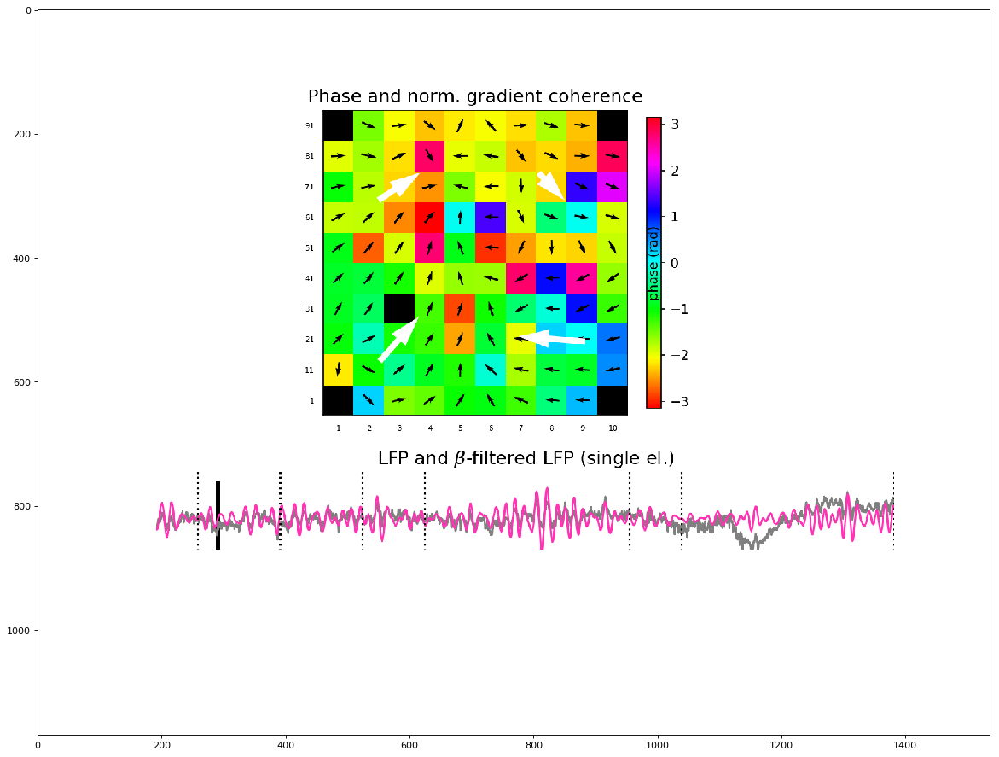

In [17]:
from matplotlib import animation, rc
import matplotlib.image as mpimg
from IPython.display import HTML
matplotlib.animation.embed_limit=100

def animate(i):
    img=mpimg.imread('ProjectsData/collab-waves/figs/ms_figs/movs1_small/movie_i140703-001_filter_beta_large_trialid_45'
                     '/png/i140703-001_filter_beta_large_trialid_45_%05i.png' % (i))
    imgplot = plt.imshow(img, animated=True)
    return imgplot,
fig = plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
anim = animation.FuncAnimation(fig, animate, frames=150, interval=50, blit=True)
HTML(anim.to_jshtml())